In [1]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats
from scipy.optimize import curve_fit
from copy import deepcopy
import os
import pandas as pd
import seaborn as sns
sns.set()

In [3]:
prepath = ''

def plotRD(country,scale,ngrams,timeint,totalgrams,ax=None):
    """ Plot rank diversity using 4 different parameters 
    Input: 
    Country (str)<- Mexico,United_Kingdom
    scale (int) <- (-1,0,1)
    ngrams (int) <- (1,2,3,4,5)
    timeint (int) <- (3,6,12,24,48,96)
    """
    admins = {"Mexico":["cdmx","coyoacan"], "United_Kingdom":["london","borough_of_camden"]}
    if scale != -1:
        path = prepath+'{}/{}/results_normalizados_{}grams/{}hour_{}grams_RD.txt'.format(country,admins[country][scale],totalgrams,timeint,ngrams)
    else:
        path = prepath+'{}/results_normalizados_{}grams/{}hour_{}grams_RD.txt'.format(country,totalgrams,timeint,ngrams)
        
    data = np.loadtxt(path)
    
    if not ax:
        fig = plt.figure(figsize=(10,7))
        ax = fig.add_subplot(1,1,1)
        if scale != -1:ax.set_title("{},{},ngrams={},$\delta t$={}".format(country,admins[country][scale],ngrams,timeint))
        else:ax.set_title("{},ngrams={},$\delta t$={}".format(country,ngrams,timeint))
        ax.grid(which='both')
    if scale != -1:
        ax.plot(data[:,0],data[:,1],label='{},{},$\delta t$={},ng={}'.format(country,admins[country][scale],timeint,ngrams))
    else:
        ax.plot(data[:,0],data[:,1],label='{},$\delta t$={},ng={}'.format(country,timeint,ngrams))
    ax.set_xlabel("$k$",fontsize=20)
    ax.set_ylabel('d(k)',fontsize=20)
    ax.set_xscale('log')
#     ------------------------------------------------------------
def EvalnormCdf(x,mu,sigma):
    return scipy.stats.norm.cdf(np.log10(x),loc=mu,scale=sigma)

def ajuste(data_fit,funcion):
    X = data_fit[:,0]
    Y = data_fit[:,1]
    param_model, pcov1 = curve_fit(funcion,X,Y)
    return param_model

def plotnormCdfFit(country,scale,ngrams,timeint,totalgrams,ax=None,activeplot=False):
    """
    Assumes that country is a string, scale, ngrams, timeint and totalgrams integers.
    ax a matplotlib axes object. The parameter activeplot, if true, plot the resulting ccdf
    Returns fitted parameters of a cumulative lognormal distribution to data. 
    """

    admins = {"Mexico":["cdmx","coyoacan"], "United_Kingdom":["london","borough_of_camden"]}
    if scale != -1:
        path = prepath+'{}/{}/results_normalizados_{}grams/{}hour_{}grams_RD.txt'.format(country,admins[country][scale],totalgrams,timeint,ngrams)
    else:
        path = prepath+'{}/results_normalizados_{}grams/{}hour_{}grams_RD.txt'.format(country,totalgrams,timeint,ngrams)
        
    data = np.loadtxt(path)
    parametros = ajuste(data,EvalnormCdf)
    if activeplot:
        if not ax:
            fig = plt.figure(figsize=(10,7))
            ax = fig.add_subplot(1,1,1)
            ax.grid(which='both')
        ax.plot(data[:,0],EvalnormCdf(data[:,0],*parametros),'--',label="$\mu$={:.3},$\sigma$={:.3}".format(*parametros))
    #     ax.plot(np.log10(data[:,0]),EvalnormCdf(data[:,0],*parametros),'--',label="$\mu$={:.3},$\sigma$={:.3}".format(*parametros))
        ax.set_xlabel("k",fontsize=20)
        ax.set_ylabel('d(k)',fontsize=20)
        ax.set_xscale('log')
        
    return parametros

/home/emmanuel/miniconda3/envs/toughenv/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()
/home/emmanuel/miniconda3/envs/toughenv/lib/python3.7/site-packages/ipykernel_launcher.py:30: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/home/emmanuel/miniconda3/envs/toughenv/lib/python3.7/site-packages/ipykernel_launcher.py:49: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.fi

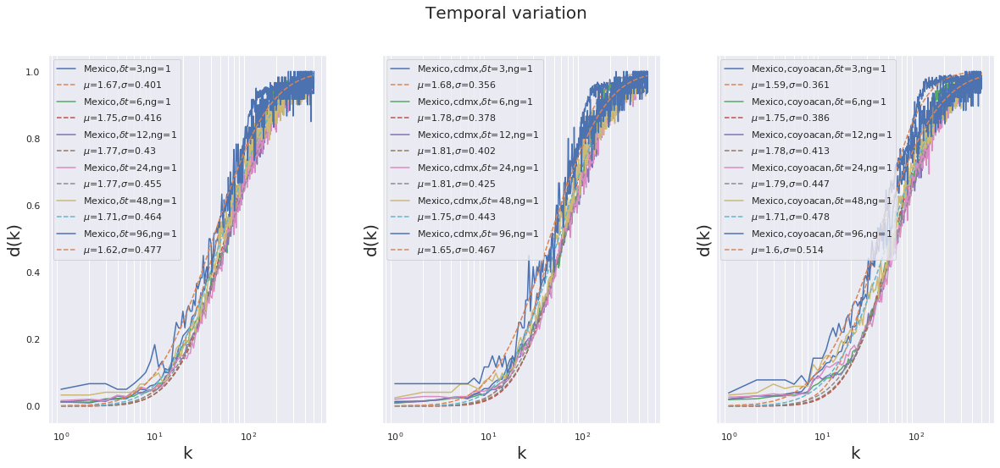

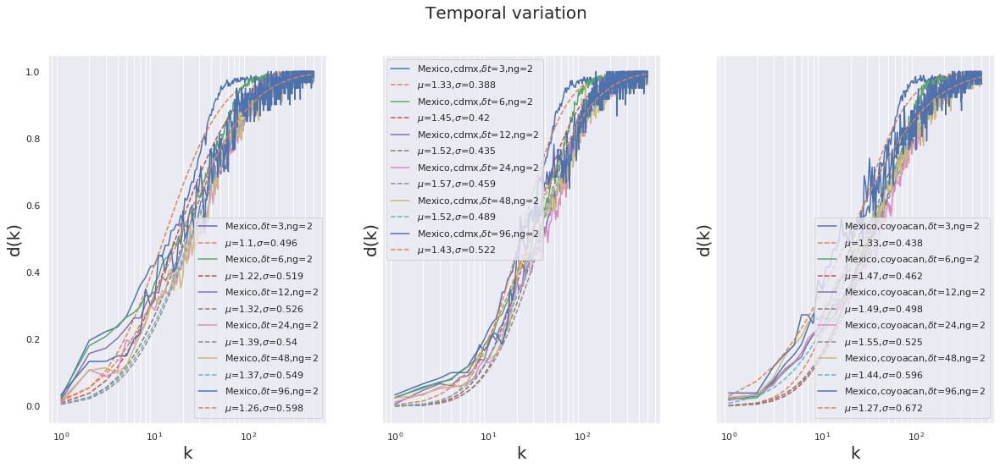

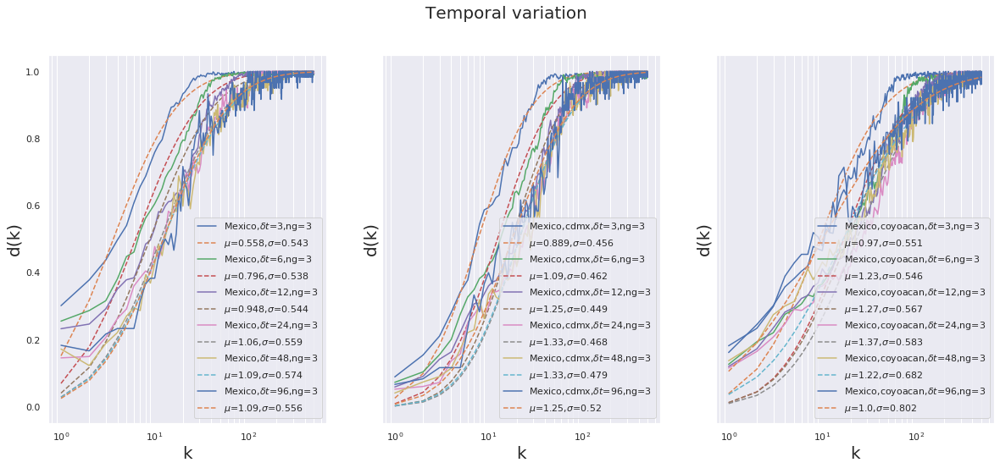

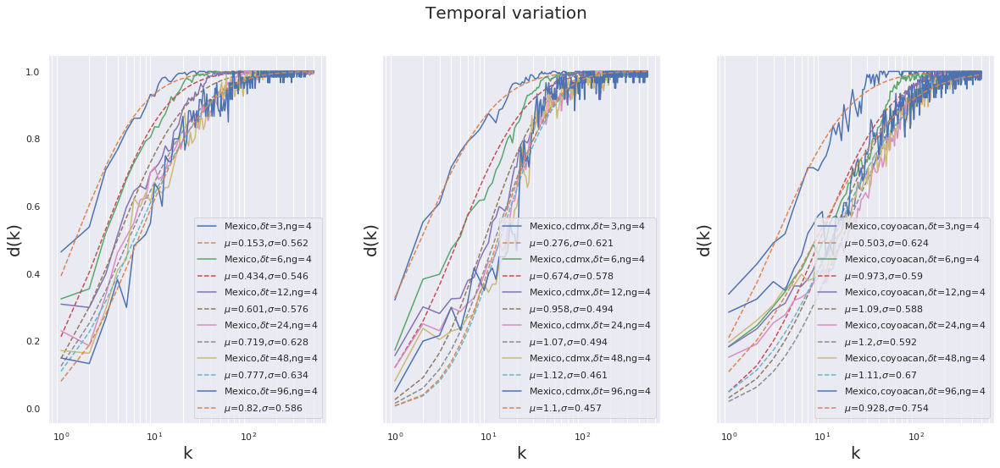

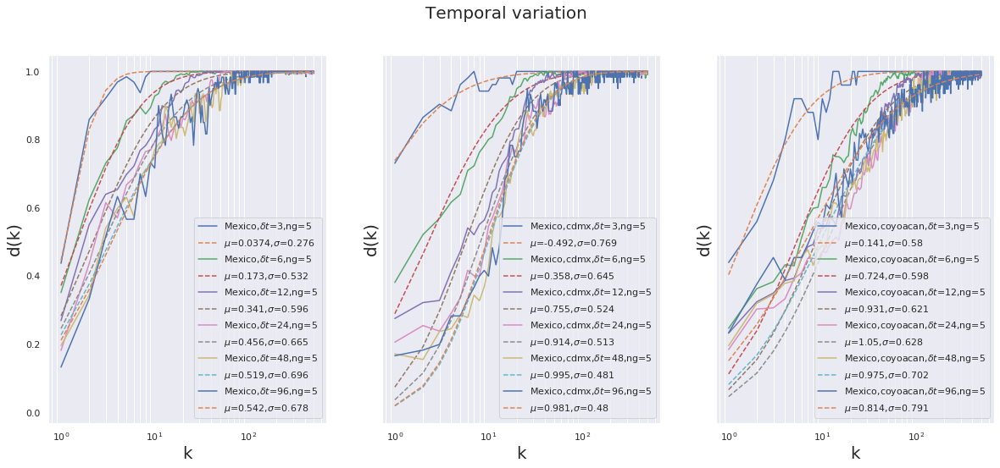

...

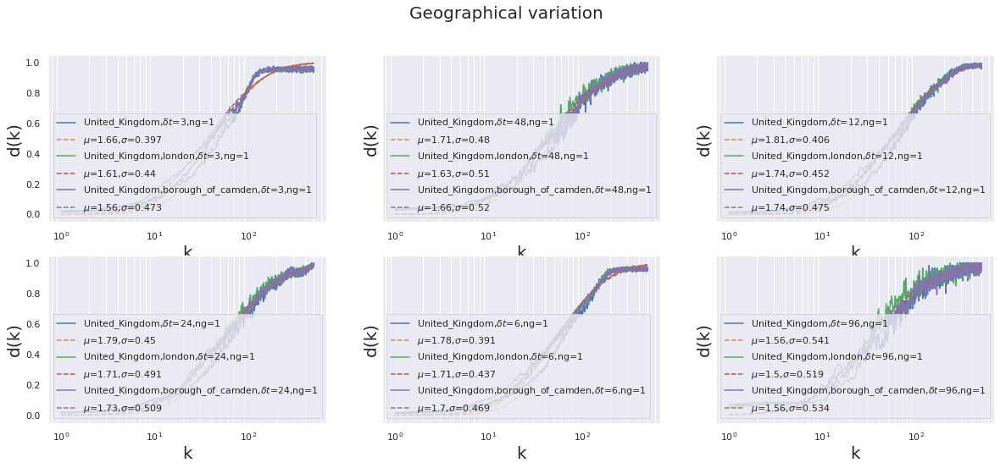

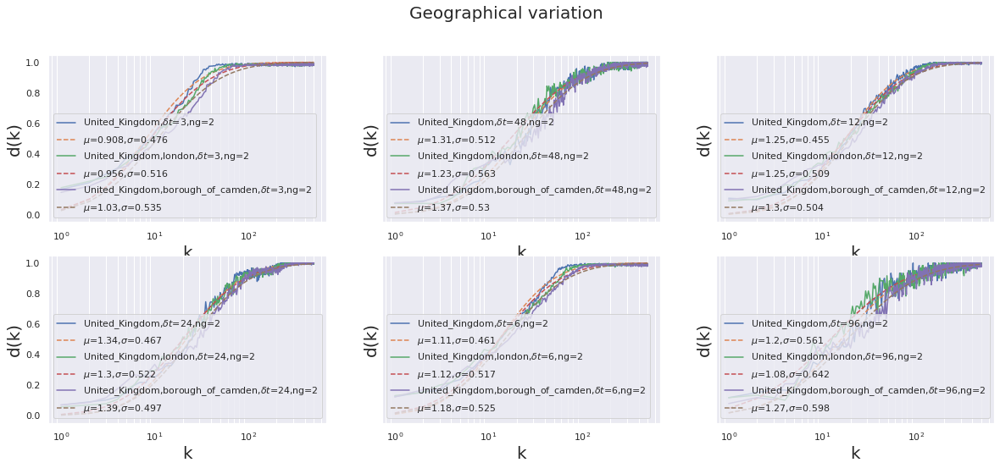

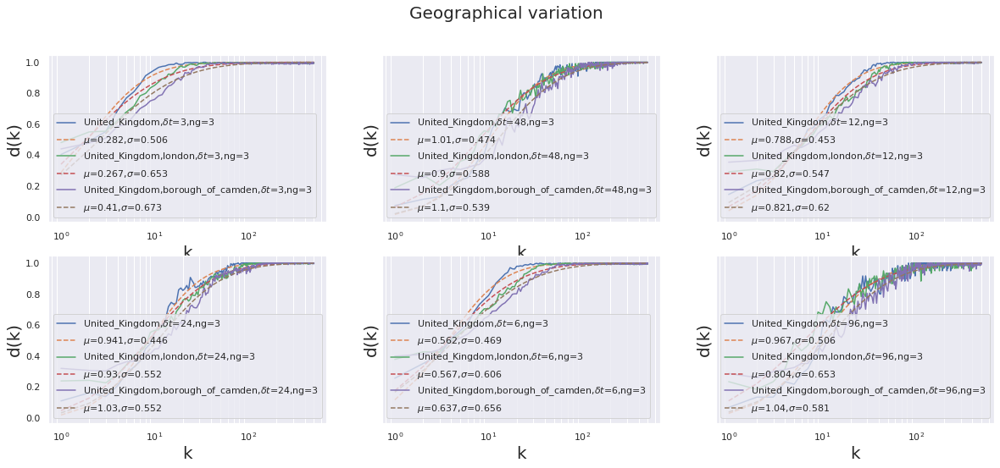

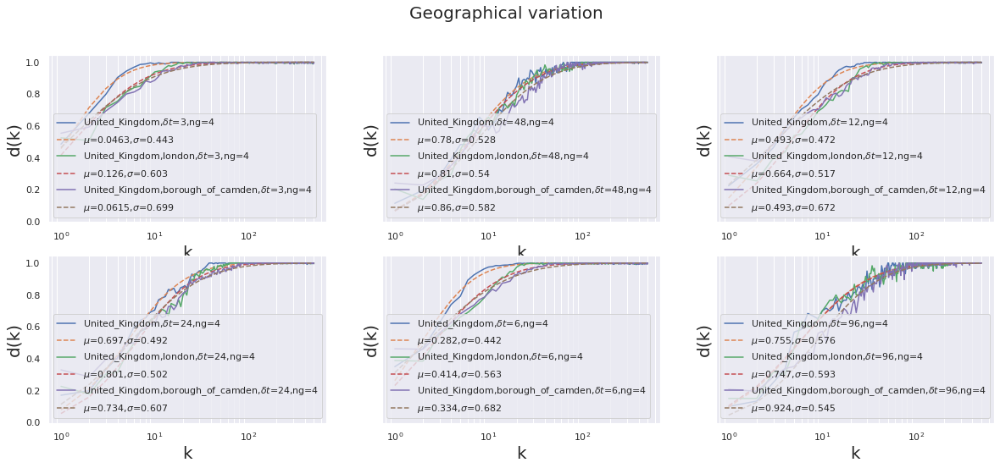

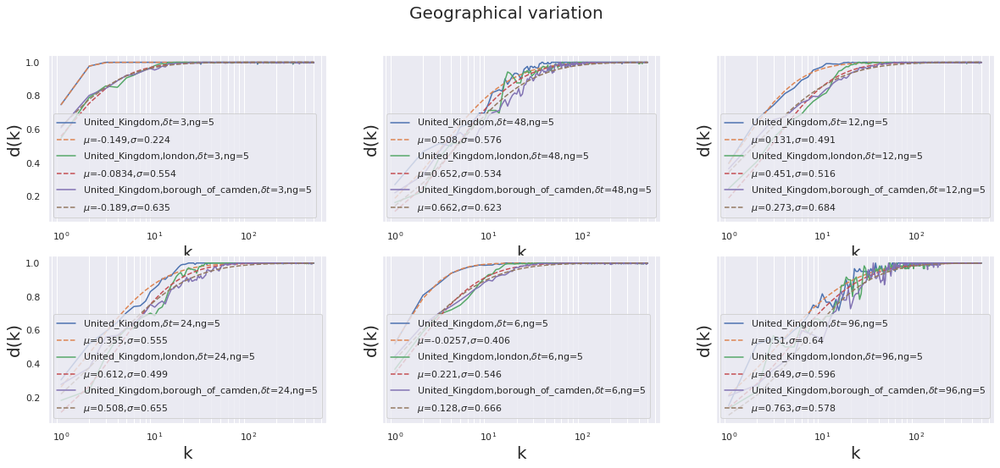

In [4]:
NGRAMS = [1,2,3,4,5]
TIME = [3,6,12,24,48,96]
SPATIAL = [-1,0,1]
countries = ["Mexico", "United_Kingdom"]
MAPEO = {"Mexico":{-1:"Mexico",0:"CDMX",1:"COYO"}, "United_Kingdom":{-1:"United_Kingdom",0:"London",1:"Camden"} }
totalgrams = 500

for country in countries:
    ##Displaying time variation
    for ngrams in NGRAMS:
        fig,ax = plt.subplots(nrows=1,ncols=3,figsize=(20,8),sharey=True)
        for i,scale in enumerate(SPATIAL):
            for t in TIME:
                plotRD(country,scale,ngrams,t,ax=ax[i],totalgrams=totalgrams)            
            
                plotnormCdfFit(country,scale,ngrams,t,totalgrams=totalgrams,ax=ax[i],activeplot=True)

            ax[i].grid(which="both")
            ax[i].legend()
            plt.suptitle('Temporal variation',fontsize=20)
            
#         saving_path=os.path.join(path,"{}grams".format(totalgrams),country,'displaying_time','{}grams'.format(ngrams))
#         if not os.path.exists(saving_path):
#             os.makedirs(saving_path)
#         plt.savefig(os.path.join(saving_path,'{}'.format(MAPEO[country])),format='pdf')
#         plt.close()
    ##Displaying ngrams variation
        
    for timeint in TIME:
        fig,ax = plt.subplots(nrows=1,ncols=3,figsize=(20,8),sharey=True)
        for i,scale in enumerate(SPATIAL):
            for ngram in NGRAMS:
                plotRD(country,scale,ngrams=ngram,timeint=timeint,ax=ax[i],totalgrams=totalgrams)

                plotnormCdfFit(country,scale,ngrams=ngram,timeint=timeint,totalgrams=totalgrams,ax=ax[i],activeplot=True)

            ax[i].grid(which="both")
            ax[i].legend()
            plt.suptitle('Ngrams variation',fontsize=20)
            
#         saving_path=os.path.join(path,"{}grams".format(totalgrams),country,'displaying_ngrams','{}hrs'.format(timeint))
#         if not os.path.exists(saving_path):
#             os.makedirs(saving_path)
#         plt.savefig(os.path.join(saving_path,'{}'.format(MAPEO[country])),format='pdf')
#         plt.close()
    #Displaying scale variation
    
    for ngrams in NGRAMS:
        fig,ax = plt.subplots(nrows=2,ncols=3,figsize=(20,8),sharey=True)
        for i,timeint in enumerate(TIME):
            j= i%2
            i= i%3
            
            for scale in SPATIAL:
                plotRD(country=country,scale=scale,ngrams=ngrams,timeint=timeint,ax=ax[j,i],totalgrams=totalgrams)

                plotnormCdfFit(country=country,scale=scale,ngrams=ngrams,timeint=timeint,totalgrams=totalgrams,ax=ax[j,i],activeplot=True)

            ax[j,i].grid(which="both")
            ax[j,i].legend()
            plt.suptitle('Geographical variation',fontsize=20)
            
#         saving_path=os.path.join(path,"{}grams".format(totalgrams),country,'displaying_scale','{}grams'.format(ngrams))
#         if not os.path.exists(saving_path):
#             os.makedirs(saving_path)
#         plt.savefig(os.path.join(saving_path,'{}hrs'.format(timeint)),format='pdf')
#         plt.close()

In [6]:
def mu_sigma_ngramsvar(fixed,value,country,scale,ngrams,timeint,parametros,ax=None):
    """
    Input:
    fixed: str, 'scale' or 'time'
    value: str, 'mu' or 'sigma'
    Parametros expect a pandas dataframe object.
    """
    admins = {"Mexico":["cdmx","coyoacan"], "United_Kingdom":["london","borough_of_camden"]}
    #ngrams variation
    
    if fixed == 'scale':
        #scale fixed (mu vs time interval)
        
        if scale != -1:
            ax.plot(TIME,parametros.loc[ngrams],marker='o',label='{},{},ng={}'.format(country,admins[country][scale],ngrams))
        else:
            ax.plot(TIME,parametros.loc[ngrams],marker='o',label='{},ng={}'.format(country,ngrams))
        ax.set_xlabel('Temporal scale (hrs)',fontsize=20)
#         ax.set_xticks(TIME)
        if value == 'mu':
            ax.set_ylabel('$\mu$',fontsize=20)
        else:
            ax.set_ylabel('$\sigma$',fontsize=20)
        ax.set_xscale('log')
    else:
        #time interval fixed (mu vs spatial scale)
        spatial_var = [MAPEO[country][-1],MAPEO[country][0],MAPEO[country][1]]
        ax.plot(spatial_var,parametros.loc[ngrams],marker='o',label='$\delta t$={},ng={}'.format(timeint,ngrams))
        ax.set_xlabel('Geographical scale',fontsize=20)
#         ax.set_xticks(TIME)
        if value == 'mu':
            ax.set_ylabel('$\mu$',fontsize=20)
        else:
            ax.set_ylabel('$\sigma$',fontsize=20)

def mu_sigma_timevar(fixed,value,country,scale,ngrams,timeint,parametros,ax=None):
    """
    Input:
    fixed: str, 'scale' or 'ngrams'
    value: str, 'mu' or 'sigma'
    Parametros expect a pandas dataframe object.
    """
    admins = {"Mexico":["cdmx","coyoacan"], "United_Kingdom":["london","borough_of_camden"]}       
    #temporal variation
    
    if fixed == 'scale':
        #scale fixed (mu vs ngrams)
        if scale != -1:
            ax.plot(NGRAMS,parametros.loc[timeint],marker='o',label='{},{},$\delta t$={}'.format(country,admins[country][scale],timeint))
        else:
            ax.plot(NGRAMS,parametros.loc[timeint],marker='o',label='{},$\delta t$={}'.format(country,timeint))
        ax.set_xlabel('Gramatical scale',fontsize=20)
#         ax.set_xticks(TIME)
        if value == 'mu':
            ax.set_ylabel('$\mu$',fontsize=20)
        else:
            ax.set_ylabel('$\sigma$',fontsize=20)
    else:
        #ngrams fixed (mu vs spatial scale)
        spatial_var = [MAPEO[country][-1],MAPEO[country][0],MAPEO[country][1]]
        ax.plot(spatial_var,parametros.loc[timeint],marker='o',label='$\delta t$={},ng={}'.format(timeint,ngrams))
        ax.set_xlabel('Geographical scale',fontsize=20)
#         ax.set_xticks(TIME)
        if value == 'mu':
            ax.set_ylabel('$\mu$',fontsize=20)
        else:
            ax.set_ylabel('$\sigma$',fontsize=20)
    

def mu_sigma_spatialvar(fixed,value,country,scale,ngrams,timeint,parametros,ax=None):
    """
    Input:
    fixed: str, 'scale' or 'ngrams'
    value: str, 'mu' or 'sigma'
    Parametros expect a pandas dataframe object.
    """
    admins = {"Mexico":["cdmx","coyoacan"], "United_Kingdom":["london","borough_of_camden"]}
    #spatial variation
    
    if fixed == 'time':
        #time interval fixed (mu vs ngrams)
        if scale != -1:
            ax.plot(NGRAMS,parametros.loc[scale],marker='o',label='{},{},$\delta t$={}'.format(country,admins[country][scale],timeint))
        else:
            ax.plot(NGRAMS,parametros.loc[scale],marker='o',label='{},$\delta t$={}'.format(country,timeint))
        ax.set_xlabel('Gramatical scale',fontsize=20)
#         ax.set_xticks(TIME)
        if value == 'mu':
            ax.set_ylabel('$\mu$',fontsize=20)
        else:
            ax.set_ylabel('$\sigma$',fontsize=20)
    else:
        #ngrams fixed (mu vs time intervals)
        if scale != -1:
            ax.plot(TIME,parametros.loc[scale],marker='o',label='{},{},ng={}'.format(country,admins[country][scale],ngrams))
        else:
            ax.plot(TIME,parametros.loc[scale],marker='o',label='{},ng={}'.format(country,ngrams))
        ax.set_xlabel('Temporal scale (hrs)',fontsize=20)
#         ax.set_xticks(TIME)
        if value == 'mu':
            ax.set_ylabel('$\mu$',fontsize=20)
        else:
            ax.set_ylabel('$\sigma$',fontsize=20)
        ax.set_xscale('log')
            

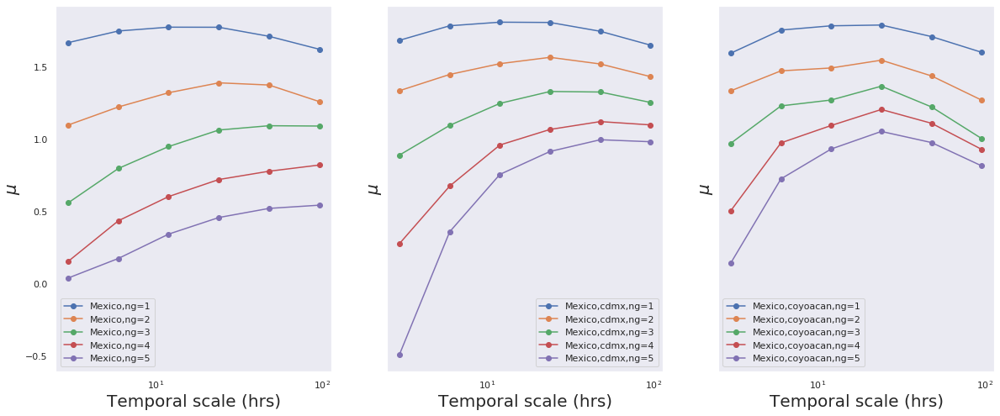

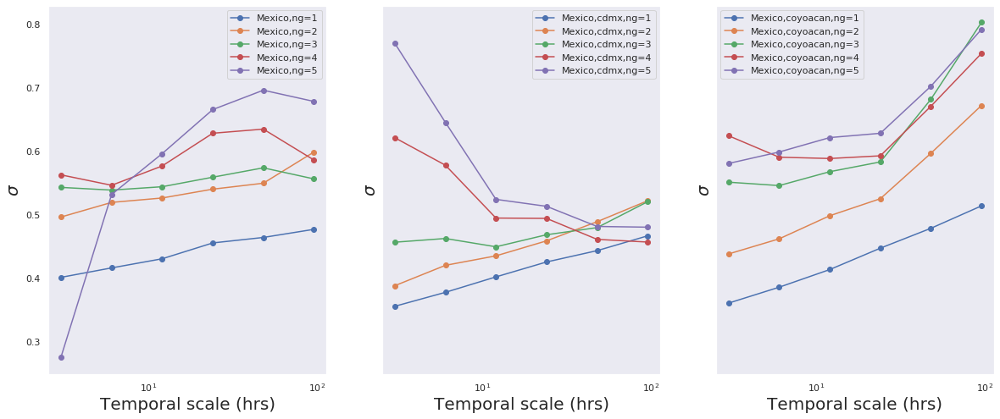

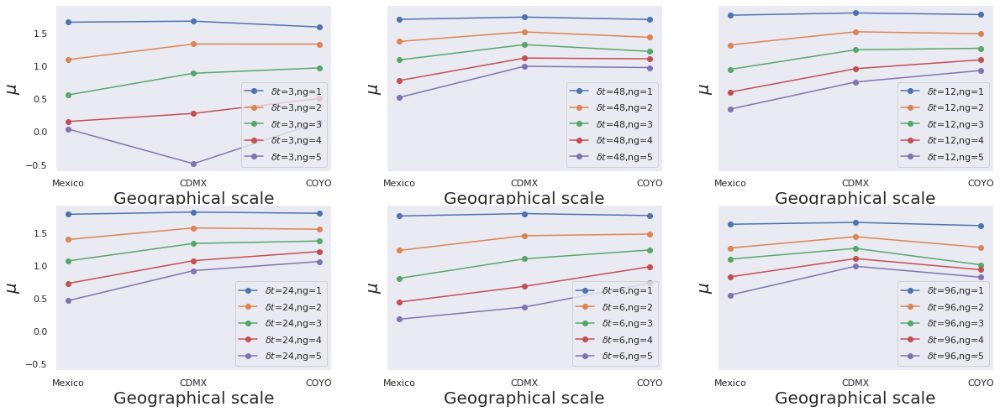

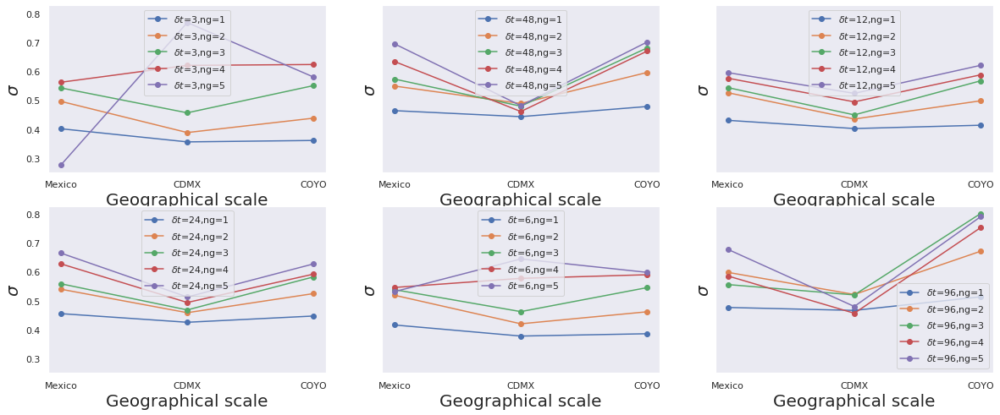

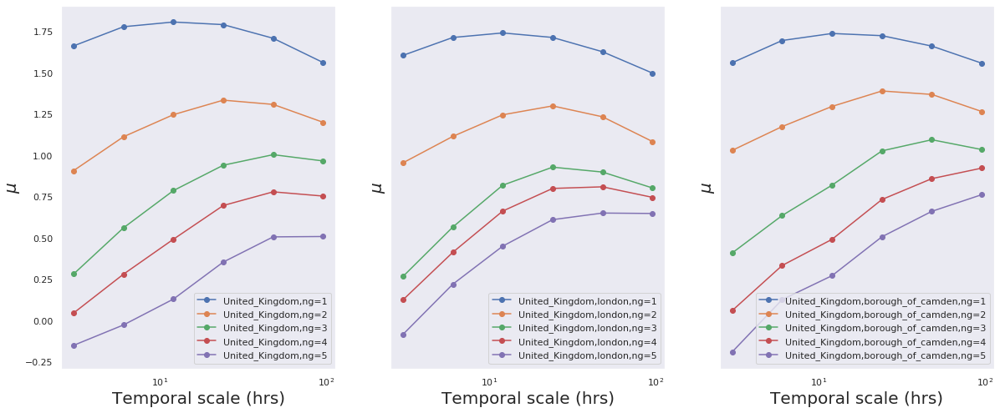

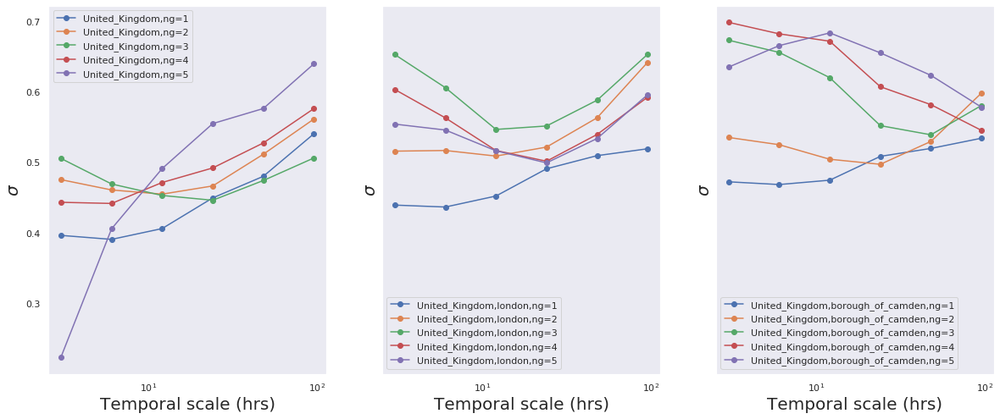

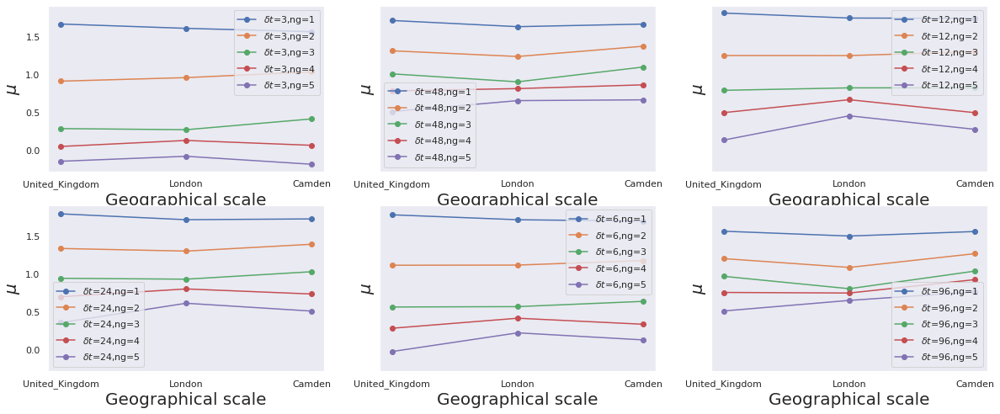

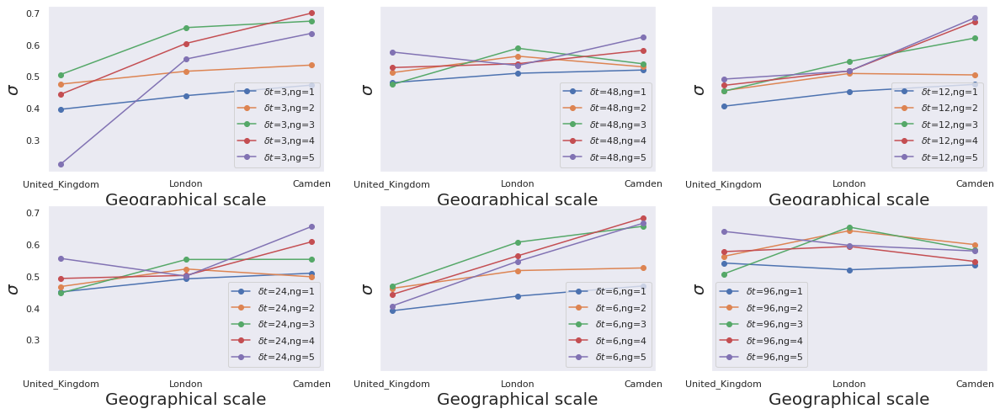

In [7]:
NGRAMS = [1,2,3,4,5]
TIME = [3,6,12,24,48,96]
SPATIAL = [-1,0,1]
countries = ["Mexico", "United_Kingdom"]
MAPEO = {"Mexico":{-1:"Mexico",0:"CDMX",1:"COYO"}, "United_Kingdom":{-1:"United_Kingdom",0:"London",1:"Camden"} }
totalgrams=500
sharey = True

for country in countries:
    # ngrams variation
    
    #scale fixed
    fig1,ax1 = plt.subplots(nrows=1,ncols=3, figsize=(20,8),sharey=sharey)
    fig2,ax2 = plt.subplots(nrows=1,ncols=3, figsize=(20,8),sharey=sharey)
    for k,scale in enumerate(SPATIAL):

        scheme = dict( zip( ['ti='+str(i) for i in TIME], [ [] for k in range(len(TIME)) ]) )
        muandsigma = {"mu":scheme, "sigma":deepcopy(scheme)}
        Parametros_ti = dict([(count,elem) for count,elem in zip(countries,[muandsigma,muandsigma])])

        for timeint in TIME:
            for ngram in NGRAMS:
                mu,sigma = plotnormCdfFit(country,scale,ngram,timeint, totalgrams=totalgrams)
                Parametros_ti[country]['mu']['ti={}'.format(timeint)].append(mu)
                Parametros_ti[country]['sigma']['ti={}'.format(timeint)].append(sigma)
            
        df_mu = pd.DataFrame(Parametros_ti[country]['mu'],index=NGRAMS)
        df_sigma = pd.DataFrame(Parametros_ti[country]['sigma'],index=NGRAMS)

        for ngram in NGRAMS:
            mu_sigma_ngramsvar('scale','mu',country,scale,ngram,timeint,df_mu,ax=ax1[k])
            ax1[k].legend()
            ax1[k].grid()
        
#         saving_path=os.path.join(path,"{}grams".format(totalgrams),country,'displaying_ngrams','mu_vs_temporal')
#         if not os.path.exists(saving_path):
#             os.makedirs(saving_path)
#         fig1.savefig(os.path.join(saving_path,'{}'.format(MAPEO[country])),format='pdf')
#         plt.close()

        for ngram in NGRAMS:
            mu_sigma_ngramsvar('scale','sigma',country,scale,ngram,timeint,df_sigma,ax=ax2[k])
            ax2[k].grid()
            ax2[k].legend()
            
#         saving_path=os.path.join(path,"{}grams".format(totalgrams),country,'displaying_ngrams','sigma_vs_temporal')
#         if not os.path.exists(saving_path):
#             os.makedirs(saving_path)
#         fig2.savefig(os.path.join(saving_path,'{}'.format(MAPEO[country])),format='pdf')
#         plt.close()

#     time interval fixed
    fig1,ax1 = plt.subplots(nrows=2,ncols=3, figsize=(20,8),sharey=sharey)
    fig2,ax2 = plt.subplots(nrows=2,ncols=3, figsize=(20,8),sharey=sharey)
    for k,timeint in enumerate(TIME):
        muandsigmaM ={ i:s for s,i in zip([ {reg:[]} for reg in MAPEO["Mexico"].values() ],SPATIAL) }
        muandsigmaU = { i:s for s,i in zip([ {reg:[]} for reg in MAPEO["United_Kingdom"].values() ],SPATIAL) }
        muandsigmaM = {"mu":muandsigmaM,"sigma":deepcopy(muandsigmaM)}
        muandsigmaU = {"mu":muandsigmaU,"sigma":deepcopy(muandsigmaU)}
        Parametros_sc = dict([(count,elem) for count,elem in zip(countries,[muandsigmaM,muandsigmaU])])

        for scale in SPATIAL:
                for ngram in NGRAMS:
                    mu,sigma = plotnormCdfFit(country,scale,ngram,timeint, totalgrams=totalgrams)
                    Parametros_sc[country]['mu'][scale][MAPEO[country][scale]].append(mu)
                    Parametros_sc[country]['sigma'][scale][MAPEO[country][scale]].append(sigma)

        strucmu = dict( zip( [MAPEO[country][i] for i in SPATIAL], [Parametros_sc[country]['mu'][i][MAPEO[country][i]] for i in SPATIAL] ) )
        strucsigma = dict( zip( [MAPEO[country][i] for i in SPATIAL], [Parametros_sc[country]['sigma'][i][MAPEO[country][i]] for i in SPATIAL] ) )
        df_mu = pd.DataFrame(strucmu,index=NGRAMS)
        df_sigma = pd.DataFrame(strucsigma,index=NGRAMS)

        for ngram in NGRAMS:
            i = k%2
            j = k%3
            mu_sigma_ngramsvar('time','mu',country,scale,ngram,timeint,df_mu,ax=ax1[i,j])
            ax1[i,j].legend()
            ax1[i,j].grid()
        
#         saving_path=os.path.join(path,"{}grams".format(totalgrams),country,'displaying_ngrams','mu_vs_spatial')
#         if not os.path.exists(saving_path):
#             os.makedirs(saving_path)
#         fig1.savefig(os.path.join(saving_path,'{}'.format(MAPEO[country])),format='pdf')
#         plt.close()

        for ngram in NGRAMS:
            i = k%2
            j = k%3
            mu_sigma_ngramsvar('time','sigma',country,scale,ngram,timeint,df_sigma,ax=ax2[i,j])
            ax2[i,j].grid()
            ax2[i,j].legend() 

#         saving_path=os.path.join(path,"{}grams".format(totalgrams),country,'displaying_ngrams','sigma_vs_spatial')
#         if not os.path.exists(saving_path):
#             os.makedirs(saving_path)
#         fig2.savefig(os.path.join(saving_path,'{}'.format(MAPEO[country])),format='pdf')
#         plt.close()

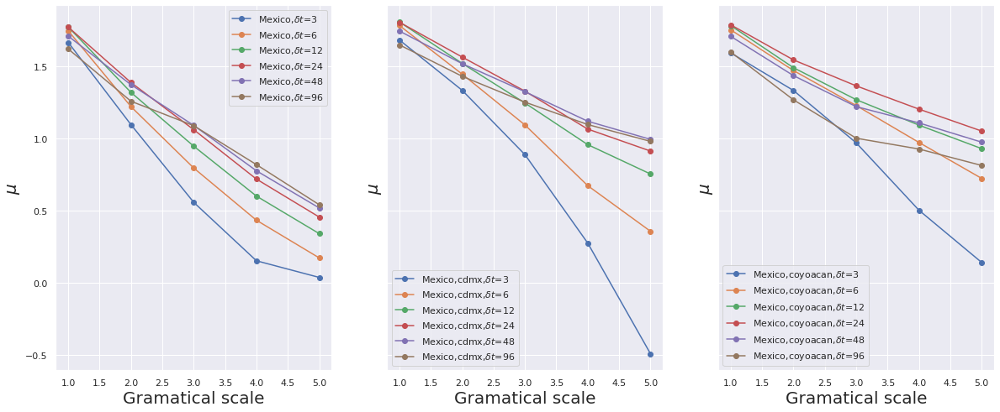

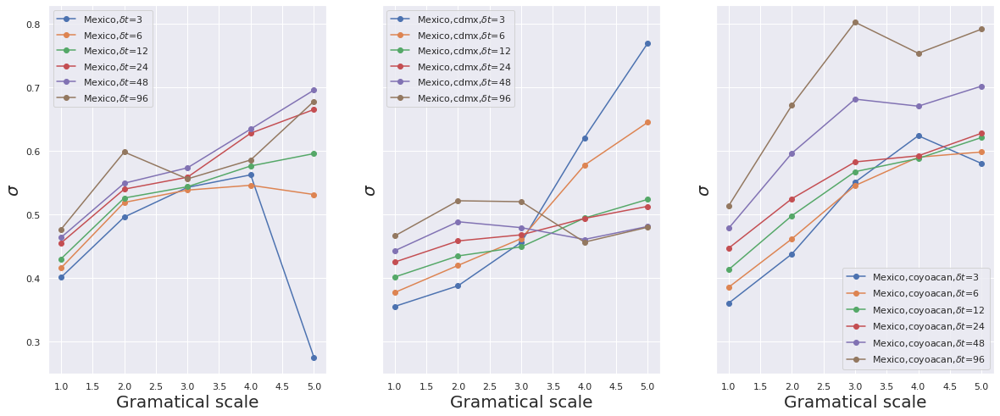

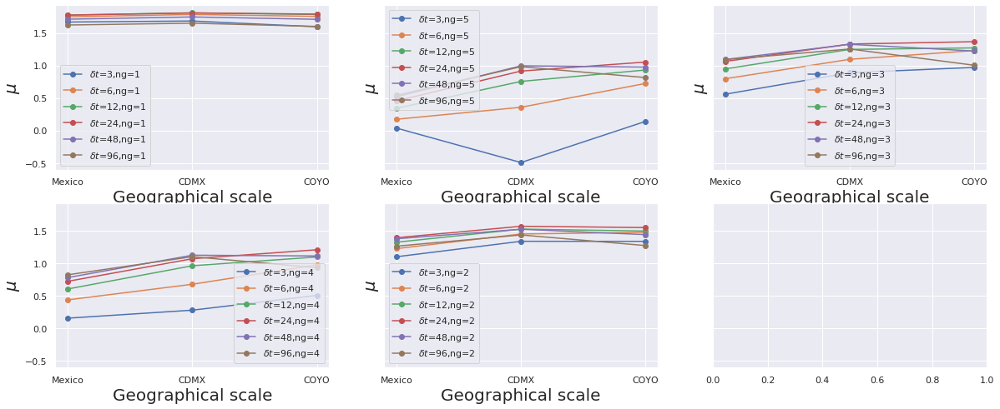

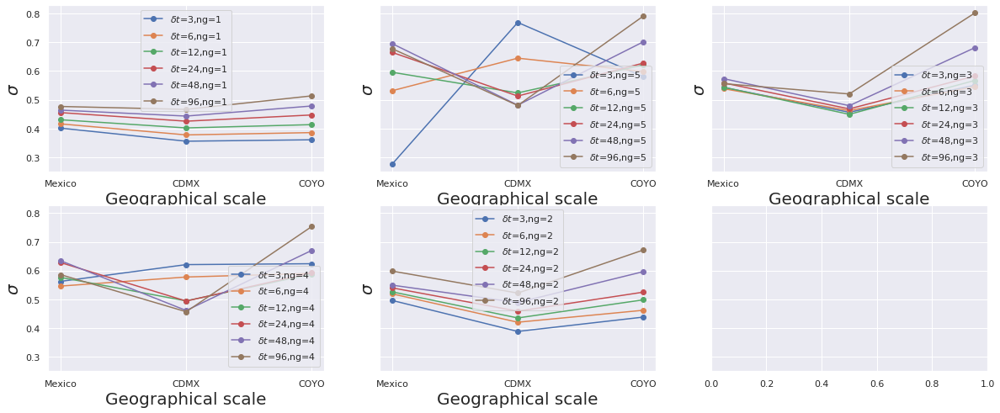

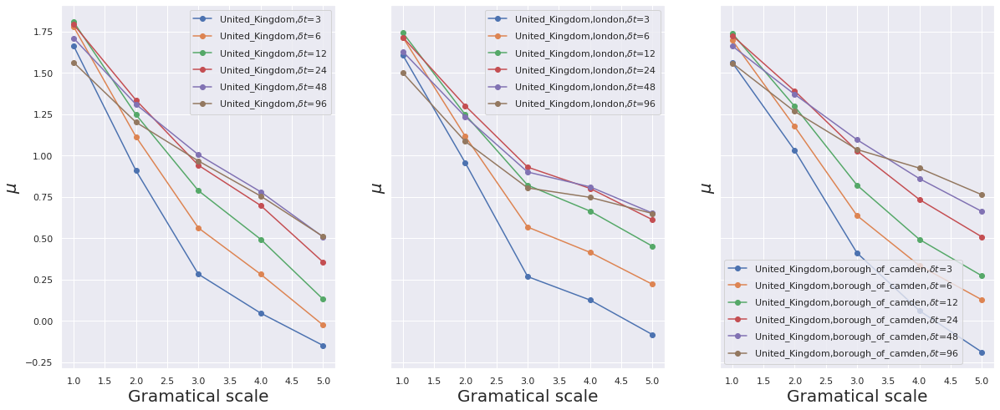

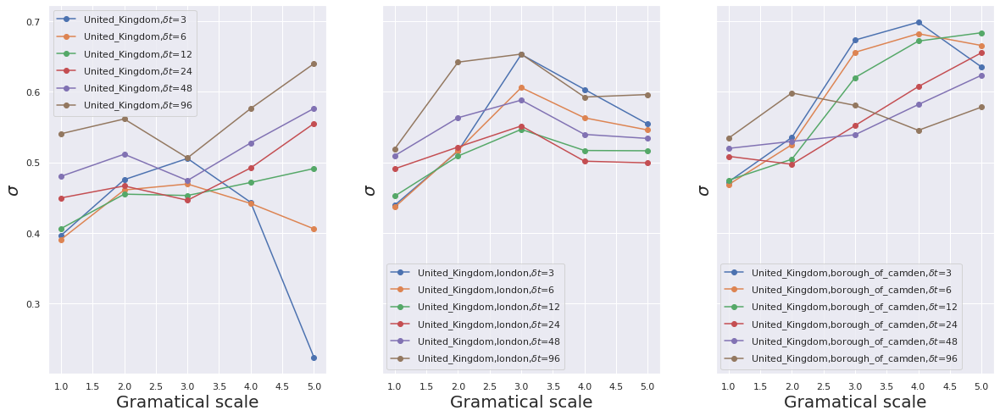

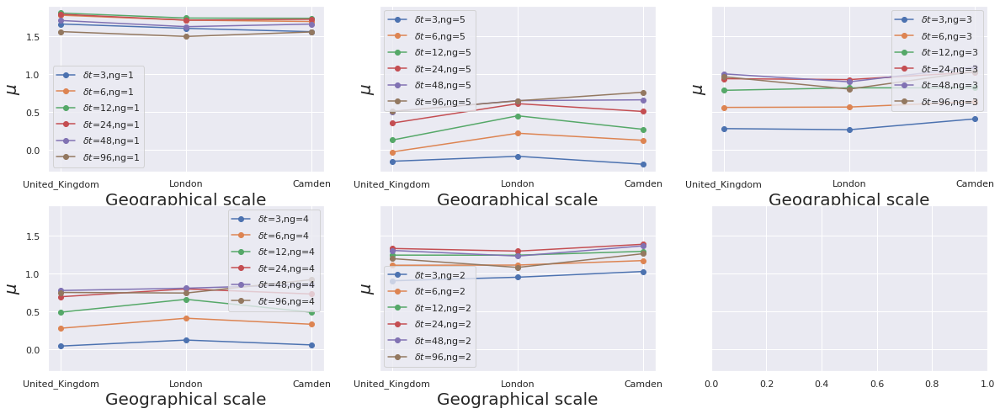

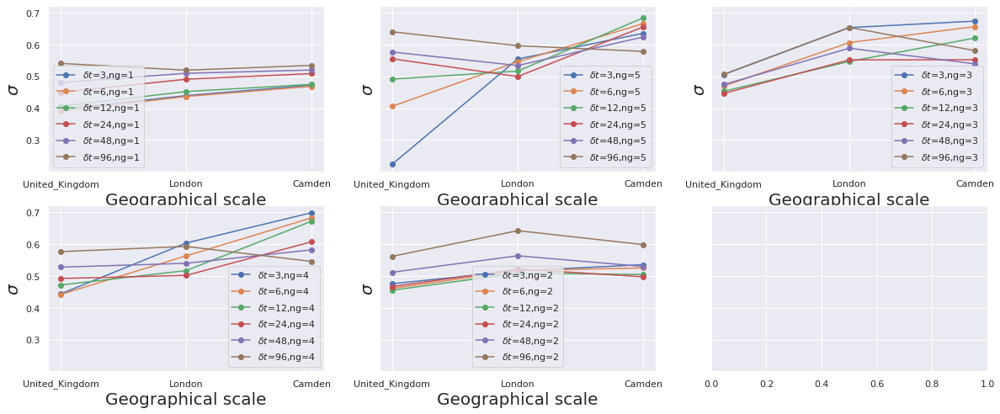

In [8]:
NGRAMS = [1,2,3,4,5]
TIME = [3,6,12,24,48,96]
SPATIAL = [-1,0,1]
countries = ["Mexico", "United_Kingdom"]
MAPEO = {"Mexico":{-1:"Mexico",0:"CDMX",1:"COYO"}, "United_Kingdom":{-1:"United_Kingdom",0:"London",1:"Camden"} }
totalgrams=500
sharey=True

for country in countries:
    # temporal variation

    #scale fixed
    fig1,ax1 = plt.subplots(nrows=1,ncols=3, figsize=(20,8),sharey=sharey)
    fig2,ax2 = plt.subplots(nrows=1,ncols=3, figsize=(20,8),sharey=sharey)
    for k,scale in enumerate(SPATIAL):
        ngrscheme = { "ng="+str(s):[] for s in NGRAMS}
        muandsigma = {"mu":ngrscheme,"sigma":deepcopy(ngrscheme)}
        Parametros_ng = {country:elem for country,elem in zip(countries,[muandsigma,muandsigma])} 

        for ng in NGRAMS:
            for time in TIME:
                mu,sigma = plotnormCdfFit(country,scale,ng,time,totalgrams)
                Parametros_ng[country]['mu']['ng={}'.format(ng)].append(mu)
                Parametros_ng[country]['sigma']['ng={}'.format(ng)].append(sigma)
            
        df_mu = pd.DataFrame(Parametros_ng[country]['mu'],index=TIME)
        df_sigma = pd.DataFrame(Parametros_ng[country]['sigma'],index=TIME)

        for time in TIME:
            mu_sigma_timevar('scale','mu',country,scale,ng,time,df_mu,ax=ax1[k])
            ax1[k].legend()
            ax1[k].grid()
        
#         saving_path=os.path.join(path,"{}grams".format(totalgrams),country,'displaying_time','mu_vs_ngrams')
#         if not os.path.exists(saving_path):
#             os.makedirs(saving_path)
#         fig1.savefig(os.path.join(saving_path,'{}'.format(MAPEO[country])),format='pdf')
#         plt.close()
        
        for time in TIME:
            mu_sigma_timevar('scale','sigma',country,scale,ng,time,df_sigma,ax=ax2[k])
            ax2[k].legend()
            ax2[k].grid()
        
#         saving_path=os.path.join(path,"{}grams".format(totalgrams),country,'displaying_time','sigma_vs_ngrams')
#         if not os.path.exists(saving_path):
#             os.makedirs(saving_path)
#         fig2.savefig(os.path.join(saving_path,'{}'.format(MAPEO[country])),format='pdf')
#         plt.close()

    #ngrams fixed
    fig1,ax1 = plt.subplots(nrows=2,ncols=3, figsize=(20,8),sharey=sharey)
    fig2,ax2 = plt.subplots(nrows=2,ncols=3, figsize=(20,8),sharey=sharey)
    for k,ng in enumerate(NGRAMS):
        muandsigmaM ={ i:s for s,i in zip([ {reg:[]} for reg in MAPEO["Mexico"].values() ],SPATIAL) }
        muandsigmaU = { i:s for s,i in zip([ {reg:[]} for reg in MAPEO["United_Kingdom"].values() ],SPATIAL) }
        muandsigmaM = {"mu":muandsigmaM,"sigma":deepcopy(muandsigmaM)}
        muandsigmaU = {"mu":muandsigmaU,"sigma":deepcopy(muandsigmaU)}
        Parametros_sc = dict([(count,elem) for count,elem in zip(countries,[muandsigmaM,muandsigmaU])])

        for scale in SPATIAL:
            for time in TIME:
                mu,sigma = plotnormCdfFit(country,scale,ng,time,totalgrams)
                Parametros_sc[country]['mu'][scale][MAPEO[country][scale]].append(mu)
                Parametros_sc[country]['sigma'][scale][MAPEO[country][scale]].append(sigma)
        
        strucmu = dict( zip( [MAPEO[country][i] for i in SPATIAL], [Parametros_sc[country]['mu'][i][MAPEO[country][i]] for i in SPATIAL] ) )
        strucsigma = dict( zip( [MAPEO[country][i] for i in SPATIAL], [Parametros_sc[country]['sigma'][i][MAPEO[country][i]] for i in SPATIAL] ) )

        df_mu = pd.DataFrame(strucmu,index=TIME)
        df_sigma = pd.DataFrame(strucsigma,index=TIME)

        for time in TIME:
            i = k%2
            j = k%3
            mu_sigma_timevar('ngrams','mu',country,scale,ng,time,df_mu,ax=ax1[i,j])
            ax1[i,j].legend()
            ax1[i,j].grid()
     
#         saving_path=os.path.join(path,"{}grams".format(totalgrams),country,'displaying_time','mu_vs_spatial')
#         if not os.path.exists(saving_path):
#             os.makedirs(saving_path)
#         fig1.savefig(os.path.join(saving_path,'ngrams'),format='pdf')
#         plt.close()

        for time in TIME:
            i = k%2
            j = k%3
            mu_sigma_timevar('ngrams','sigma',country,scale,ng,time,df_sigma,ax=ax2[i,j])
            ax2[i,j].legend()
            ax2[i,j].grid()
        
#         saving_path=os.path.join(path,"{}grams".format(totalgrams),country,'displaying_time','sigma_vs_spatial')
#         if not os.path.exists(saving_path):
#             os.makedirs(saving_path)
#         fig2.savefig(os.path.join(saving_path,'ngrams'),format='pdf')
#         plt.close()

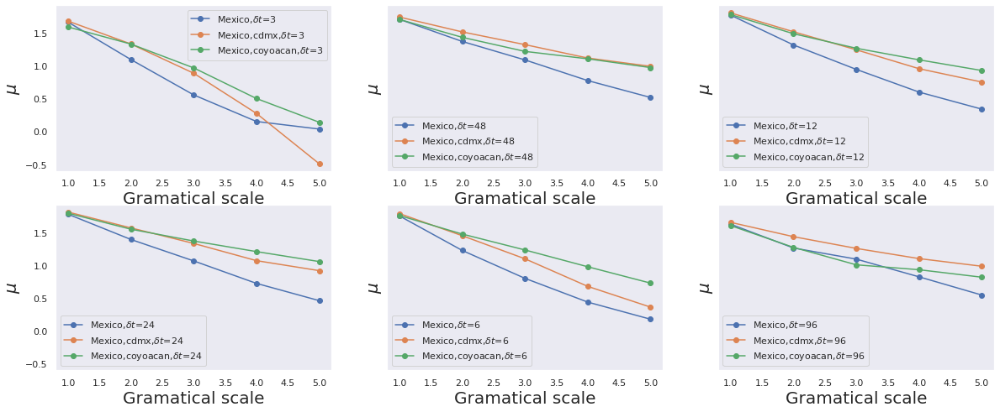

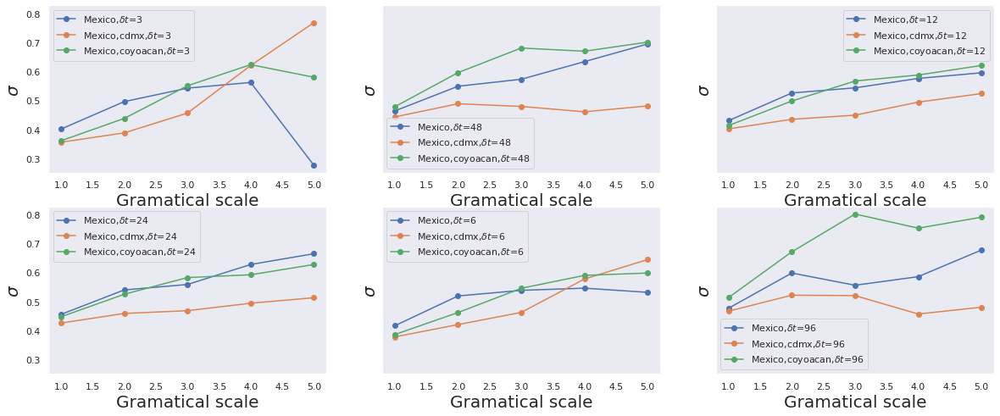

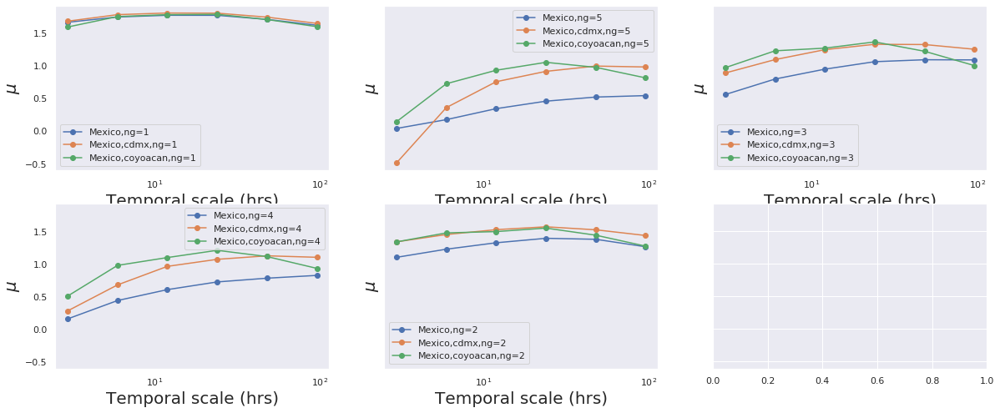

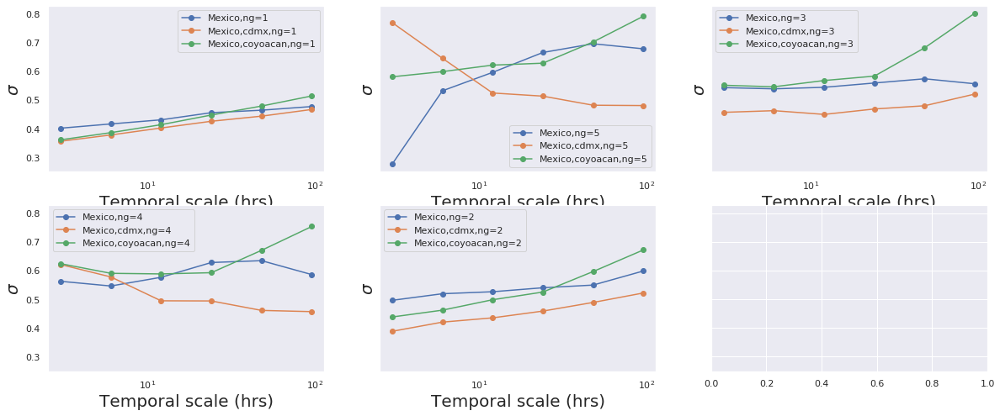

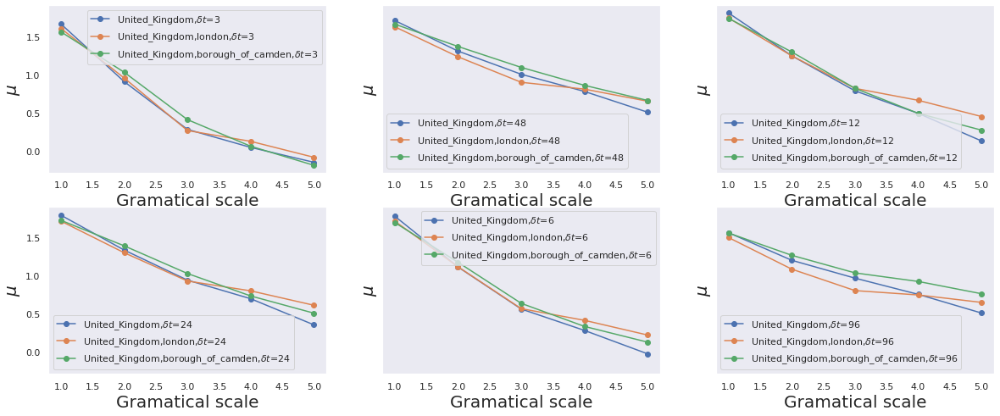

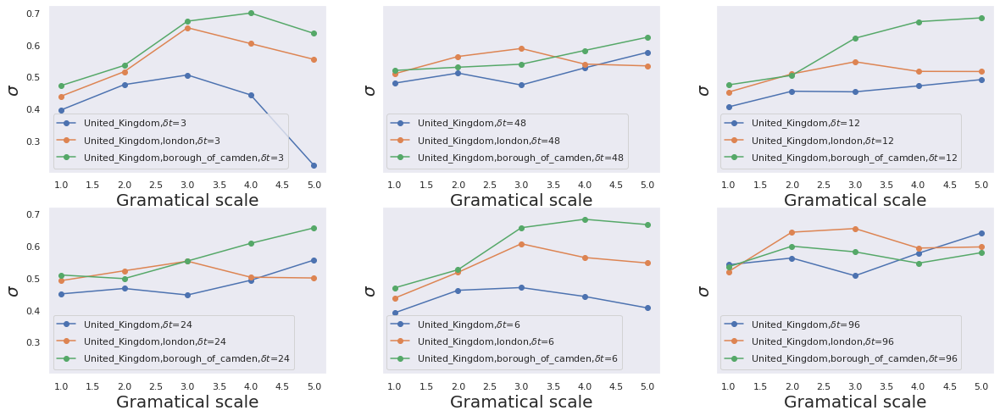

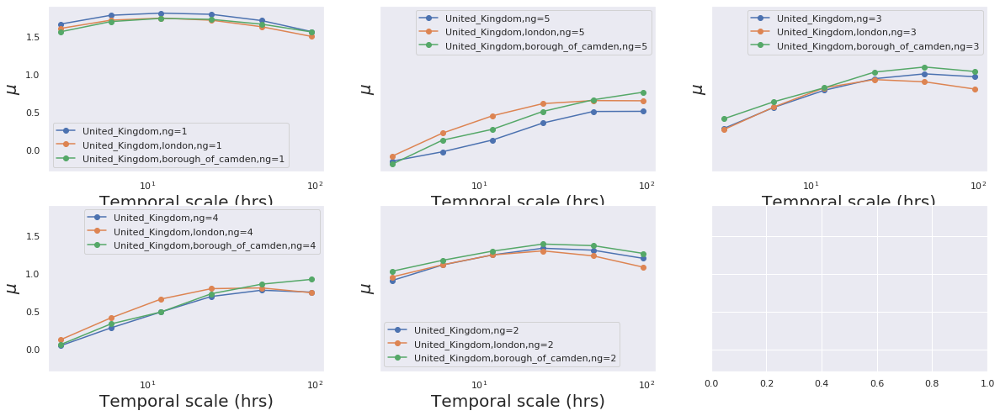

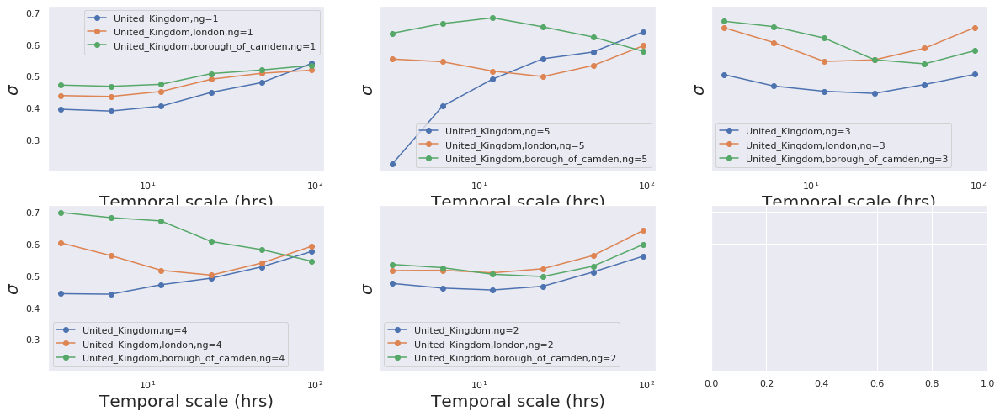

In [9]:
NGRAMS = [1,2,3,4,5]
TIME = [3,6,12,24,48,96]
SPATIAL = [-1,0,1]
countries = ["Mexico", "United_Kingdom"]
MAPEO = {"Mexico":{-1:"Mexico",0:"CDMX",1:"COYO"}, "United_Kingdom":{-1:"United_Kingdom",0:"London",1:"Camden"} }
totalgrams=500
sharey=True

for country in countries:
    #scale variation
    
    #time inteval fixed
    fig1,ax1 = plt.subplots(nrows=2,ncols=3, figsize=(20,8),sharey=sharey)
    fig2,ax2 = plt.subplots(nrows=2,ncols=3, figsize=(20,8),sharey=sharey)
    for k,timeint in enumerate(TIME):
        ngrscheme = { "ng="+str(s):[] for s in NGRAMS}
        muandsigma = {"mu":ngrscheme,"sigma":deepcopy(ngrscheme)}
        Parametros_ng = {country:elem for country,elem in zip(countries,[muandsigma,muandsigma])} 

        for ng in NGRAMS:
            for scale in SPATIAL:
                mu,sigma = plotnormCdfFit(country=country,scale=scale,ngrams=ng,timeint=timeint,totalgrams=totalgrams)
                Parametros_ng[country]['mu']['ng={}'.format(ng)].append(mu)
                Parametros_ng[country]['sigma']['ng={}'.format(ng)].append(sigma)
            
        df_mu = pd.DataFrame(Parametros_ng[country]['mu'],index=SPATIAL)
        df_sigma = pd.DataFrame(Parametros_ng[country]['sigma'],index=SPATIAL)

        for scale in SPATIAL:
            i= k%2
            j = k%3
            mu_sigma_spatialvar('time','mu',country,scale,ng,timeint,df_mu,ax=ax1[i,j])
            ax1[i,j].legend()
            ax1[i,j].grid()
        
#         saving_path=os.path.join(path,"{}grams".format(totalgrams),country,'displaying_spatial','mu_vs_ngrams')
#         if not os.path.exists(saving_path):
#             os.makedirs(saving_path)
#         fig1.savefig(os.path.join(saving_path,'allhrs'),format='pdf')
#         plt.close()
        
        for scale in SPATIAL:
            mu_sigma_spatialvar('time','sigma',country,scale,ng,timeint,df_sigma,ax=ax2[i,j])
            ax2[i,j].legend()
            ax2[i,j].grid()
        
#         saving_path=os.path.join(path,"{}grams".format(totalgrams),country,'displaying_spatial','sigma_vs_ngrams')
#         if not os.path.exists(saving_path):
#             os.makedirs(saving_path)
#         fig2.savefig(os.path.join(saving_path,'allhrs'),format='pdf')
#         plt.close()
        
    #ngrams fixed
    fig1,ax1 = plt.subplots(nrows=2,ncols=3, figsize=(20,8),sharey=sharey)
    fig2,ax2 = plt.subplots(nrows=2,ncols=3, figsize=(20,8),sharey=sharey)
    for k,ng in enumerate(NGRAMS):
        scheme = dict( zip( ['ti='+str(i) for i in TIME], [ [] for k in range(len(TIME)) ]) )
        muandsigma = {"mu":scheme, "sigma":deepcopy(scheme)}
        Parametros_ti = dict([(count,elem) for count,elem in zip(countries,[muandsigma,muandsigma])])
        
        for timeint in TIME:
            for scale in SPATIAL:
                mu,sigma = plotnormCdfFit(country,scale,ng,timeint,totalgrams)
                Parametros_ti[country]['mu']['ti={}'.format(timeint)].append(mu)
                Parametros_ti[country]['sigma']['ti={}'.format(timeint)].append(sigma)
            
        df_mu = pd.DataFrame(Parametros_ti[country]['mu'],index=SPATIAL)
        df_sigma = pd.DataFrame(Parametros_ti[country]['sigma'],index=SPATIAL)

        for scale in SPATIAL:
            i=k%2
            j=k%3
            mu_sigma_spatialvar('ngrams','mu',country,scale,ng,timeint,df_mu,ax=ax1[i,j])
            ax1[i,j].legend()
            ax1[i,j].grid()
        
#         saving_path=os.path.join(path,"{}grams".format(totalgrams),country,'displaying_spatial','mu_vs_temporal')
#         if not os.path.exists(saving_path):
#             os.makedirs(saving_path)
#         fig1.savefig(os.path.join(saving_path,'ngrams'),format='pdf')
#         plt.close()
        
        for scale in SPATIAL:
            i=k%2
            j=k%3
            mu_sigma_spatialvar('ngrams','sigma',country,scale,ng,timeint,df_sigma,ax=ax2[i,j])
            ax2[i,j].legend()
            ax2[i,j].grid()
        
#         saving_path=os.path.join(path,"{}grams".format(totalgrams),country,'displaying_spatial','sigma_vs_temporal')
#         if not os.path.exists(saving_path):
#             os.makedirs(saving_path)
#         fig2.savefig(os.path.join(saving_path,'ngrams'.format(ng)),format='pdf')
#         plt.close()